# Capstones Project INSAID Telecom - Group No. 1003 Mar-2022

#1) Data Description

**gender_age_train** - Devices and their respective user gender, age and age_group

**phone_brand_device_model**- device ids, brand, and models phone_brand: note that few brands are in Chinese

Brand Name	  Brand English Mapping
'华为'	      'Huawei'
'小米'	      'Xiaomi'
'三星'	      'Samsung'
'vivo'      	'vivo'
'OPPO'	      'OPPO'
'魅族'      	'Meizu'
'酷派'	      'Coolpad'
'乐视'	      'LeEco'
'联想 '	      'Lenovo'
'HTC'       	'HTC'


**events_data** - when a user uses mobile on INSAID Telecom network, the event gets logged in this data.
Each event has an event id, location (lat/long), and the event corresponds to frequency of mobile usage.
timestamp: when the user is using the mobile.

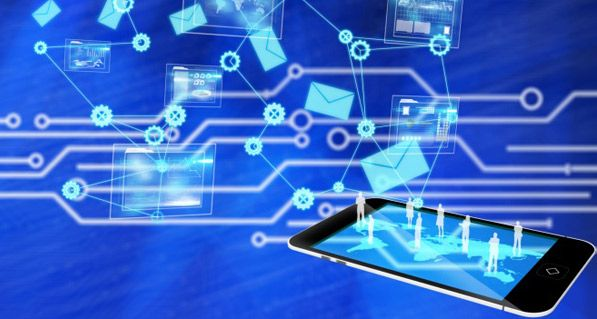

Download the DataSets for events_data from : events_data.csv
        

        
Download the DataSets for gender_age_train & phone_brand_device_model onto Python by connecting to the below
provided MySQL instance.

           
host	'cpanel.insaid.co'
user	'student'
passwd	'student'
database	'Capstone1' 


Use "mysql.connector" package in Python.

#2) Problem Statement
In this consulting assignment, Insaidians are expected to build a dashboard to understand user's demographic characteristics based on their mobile usage, geolocation, and mobile device properties. Doing so will help millions of developers and brand advertisers around the world pursuedata-driven marketing efforts which are relevant to their users and catered to their preferences.



#3) Installing and importing Liberaries

In [156]:
!pip install -q datascience                   # Package that is required by pandas profiling
!pip install -q pandas-profiling              # Library to generate basic statistics about data
!pip install -q --upgrade pandas-profiling
!pip install mysql-connector-python

In [157]:
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis) 
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high      
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity      
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
from matplotlib.pylab import rcParams                               # Backend used for rendering and GUI integration                                               
import seaborn as sns                                               # Importin seaborm library for interactive visualization
#-------------------------------------------------------------------------------------------------------------------------------
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

In [158]:
%matplotlib inline

In [159]:
#fetching file from drive
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [160]:
#Authentication for google drive
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [161]:
link = 'https://drive.google.com/file/d/1N8dbZ8e7g1dttu6wfb6IF9SM3k6qN9zf/view?usp=sharing'

In [162]:
fluff, id = link.split('=')
file1 = drive.CreateFile({'id': '1N8dbZ8e7g1dttu6wfb6IF9SM3k6qN9zf'})
file1.GetContentFile('events_data.csv')

#Data Acqusition(event_data.csv)

In [163]:
#Reading CSV file from Drive
import pandas as pd
Event_data = pd.read_csv('events_data.csv')
Event_data.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.00000,2016-05-07 22:52:05,77.22568,28.73014,Delhi,Delhi
1,2955066,4734221357723754496.00000,2016-05-01 20:44:16,88.38836,22.66033,Calcutta,WestBengal
2,605968,-3264499652692492800.00000,2016-05-02 14:23:04,77.25681,28.75791,Delhi,Delhi
3,448114,5731369272434022400.00000,2016-05-03 13:21:16,80.34361,13.15333,Chennai,TamilNadu
4,665740,338888002570799936.00000,2016-05-06 03:51:05,85.99774,23.84261,Bokaro,Jharkhand


#Data Preprocessing Steps:
1) Coversion of timestamp column to DateTime and also add two new columns Date and Time

2)Filling Missing states with respect to city.

3)Filling Device ids accourding to mode of device id(chennai)

4)Conversion of Device_id to INT and converting Device_ids to possitive values

5)As we observed that Date and Time columns are object convert it to DateTime Format

6)Filling missing Latitude of dataset according to city

7)Filling missing Longitude of dataset according to city

8)Subsetting Dataframe by desired states('TamilNadu', 'Manipur', 'Chandigarh', 'Tripura', 'UttarPradesh', 'ArunachalPradesh')




In [164]:
Event_data.isnull().sum() #Checking Null value counts

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [165]:
Event_data.info() #Events data info


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Dtype  
---  ------     -----  
 0   event_id   int64  
 1   device_id  float64
 2   timestamp  object 
 3   longitude  float64
 4   latitude   float64
 5   city       object 
 6   state      object 
dtypes: float64(3), int64(1), object(3)
memory usage: 173.7+ MB


In [166]:
Event_data.skew() #Checking Skewness

event_id    -0.00000
device_id   -0.02298
longitude    1.02214
latitude    -0.12797
dtype: float64

In [167]:
Event_data.describe() #Events data description

,event_id,device_id,longitude,latitude
count,3252950.00000,3252497.00000,3252527.00000,3252527.00000
mean,1626475.50000,101220009585509024.00000,78.15868,21.68851
std,939045.92342,5316758188197051392.00000,4.23557,5.78911
min,1.00000,-9222956879900150784.00000,12.56700,8.19011
25%,813238.25000,-4540611333857475072.00000,75.83543,17.80171
50%,1626475.50000,172682011159278816.00000,77.26814,22.16454
75%,2439712.75000,4861813234983622656.00000,80.31916,28.68278
max,3252950.00000,9222849349208140800.00000,95.45946,41.87190


In [168]:
print(Event_data.duplicated().sum()) #Checking Events data duplicates

0


In [169]:
Event_data['state'].isna().sum() #Checking null values of state column

377

#1) conversion timestamp column to DateTime and Conversion of datetime column into date and time seperatly

In [170]:
Event_data['timestamp'] = pd.to_datetime(Event_data['timestamp'])
Event_data['Date'] = pd.to_datetime(Event_data['timestamp']).dt.date
Event_data['Time']=Event_data['timestamp'].dt.strftime('%H:%M:%S')
Event_data.head(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
0,2765368,2973347786994914304.00000,2016-05-07 22:52:05,77.22568,28.73014,Delhi,Delhi,2016-05-07,22:52:05
1,2955066,4734221357723754496.00000,2016-05-01 20:44:16,88.38836,22.66033,Calcutta,WestBengal,2016-05-01,20:44:16
2,605968,-3264499652692492800.00000,2016-05-02 14:23:04,77.25681,28.75791,Delhi,Delhi,2016-05-02,14:23:04
3,448114,5731369272434022400.00000,2016-05-03 13:21:16,80.34361,13.15333,Chennai,TamilNadu,2016-05-03,13:21:16
4,665740,338888002570799936.00000,2016-05-06 03:51:05,85.99774,23.84261,Bokaro,Jharkhand,2016-05-06,03:51:05


#2)Replacement of states according to cities

In [171]:
#Subsetting DataFrames with null states
df_stateisnull=Event_data.loc[Event_data['state'].isnull()]
len(df_stateisnull)

377

In [172]:
print(df_stateisnull['city'].unique()) #finding unique values of city

['Pune' 'Visakhapatnam' 'Indore' 'Chennai' 'Delhi' 'Channapatna' 'Jaipur'
 'Gangarampur' 'Arambagh']


In [173]:
print(Event_data['state'].unique()) #finding unique values of state

['Delhi' 'WestBengal' 'TamilNadu' 'Jharkhand' 'AndhraPradesh'
 'Maharashtra' 'Gujarat' 'Kerala' 'MadhyaPradesh' 'Karnataka' 'Rajasthan'
 'Orissa' 'Punjab' 'UttarPradesh' 'Nagaland' 'Haryana' 'Telangana'
 'Chhattisgarh' 'Bihar' 'JammuandKashmir' 'Assam' 'Goa' 'Mizoram'
 'Tripura' 'Uttaranchal' nan 'Pondicherry' 'Manipur' 'Meghalaya'
 'ArunachalPradesh' 'HimachalPradesh' 'Chandigarh'
 'AndamanandNicobarIslands']


In [174]:
#Replacement of states according to cities
Event_data.state = Event_data.groupby('city').state.apply(lambda x: x.fillna(x.mode()[0]))
Event_data.state.isnull().sum()

0

In [175]:
print(Event_data.loc[[247698]]) #randomly checking if we fill the rightvalue for state

        event_id                  device_id           timestamp  longitude  \
247698   1565416 -1752057305775059712.00000 2016-05-02 22:54:15   75.93097   

        latitude    city          state        Date      Time  
247698  22.81884  Indore  MadhyaPradesh  2016-05-02  22:54:15  


#3)Filling Device id's with mode

In [176]:
Event_data['device_id'].isnull().sum() #checking null counts of column device_id

453

In [177]:
Df_missing_device_ids=Event_data[Event_data['device_id'].isnull()] #subsetting dataframe that are having null values for column device_id
Df_missing_device_ids['city'].unique()
len(Df_missing_device_ids)
Df_missing_device_ids.head(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
2055,1936567,NaN,2016-05-02 15:27:54,75.88296,22.81452,Indore,MadhyaPradesh,2016-05-02,15:27:54
26367,2659282,NaN,2016-05-04 14:06:24,75.88849,26.94869,Jaipur,Rajasthan,2016-05-04,14:06:24
42088,442198,NaN,2016-05-06 09:27:37,75.84601,26.96080,Jaipur,Rajasthan,2016-05-06,09:27:37
43061,1903648,NaN,2016-05-02 15:41:54,75.92333,22.77778,Indore,MadhyaPradesh,2016-05-02,15:41:54
44823,3227383,NaN,2016-05-05 08:37:09,75.99255,31.56175,Hoshiarpur,Punjab,2016-05-05,08:37:09


In [178]:
Event_data.device_id = Event_data.groupby('city').device_id.apply(lambda x: x.fillna(x.mode()[0])) #Filling device_id with mode according to city


In [179]:
print(Event_data.loc[[44823]]) #randomly checking if we fill the rightvalue for device_id

       event_id                 device_id           timestamp  longitude  \
44823   3227383 1750778632182066944.00000 2016-05-05 08:37:09   75.99255   

       latitude        city   state        Date      Time  
44823  31.56175  Hoshiarpur  Punjab  2016-05-05  08:37:09  


In [180]:
Event_data['device_id'].isnull().sum() #No null values after filling device_id

0

#4)Conversion of Device_id to INT and converting Device_ids to possitive values

In [181]:
#Conversion of Device_id to INT and converting Device_ids to possitive values
Event_data['device_id'] = Event_data['device_id'].astype(int)
Event_data['device_id']=Event_data['device_id'].abs()

In [182]:
Event_data.info() #info of Event data to check device_id dataTypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 9 columns):
 #   Column     Dtype         
---  ------     -----         
 0   event_id   int64         
 1   device_id  int64         
 2   timestamp  datetime64[ns]
 3   longitude  float64       
 4   latitude   float64       
 5   city       object        
 6   state      object        
 7   Date       object        
 8   Time       object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 223.4+ MB


#5)As we observed that Date and Time columns are object convert it to DateTime Format

In [183]:
Event_data['Time'] = Event_data['Time'].astype('datetime64[ns]')
Event_data['Date'] = Event_data['Date'].astype('datetime64[ns]')

In [184]:
#adding one more column hour to see which time is peak

In [185]:
Event_data.info() #Events data info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 9 columns):
 #   Column     Dtype         
---  ------     -----         
 0   event_id   int64         
 1   device_id  int64         
 2   timestamp  datetime64[ns]
 3   longitude  float64       
 4   latitude   float64       
 5   city       object        
 6   state      object        
 7   Date       datetime64[ns]
 8   Time       datetime64[ns]
dtypes: datetime64[ns](3), float64(2), int64(2), object(2)
memory usage: 223.4+ MB


#6)Filling missing Latitude of dataset

In [186]:
Event_data['latitude'].isnull().sum() #Checking null counts of latitude column of events data

423

In [187]:
Df_missing_latitudes=Event_data[Event_data['latitude'].isnull()] #Subsetting dataframe that are having null values for latitude
Df_missing_latitudes['city'].unique()
len(Df_missing_device_ids)
Df_missing_latitudes

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
8015,2929521,1779631023439405312,2016-05-05 01:15:22,NaN,NaN,Delhi,Delhi,2016-05-05,2022-03-18 01:15:22
9697,1017749,8790560034584249344,2016-05-03 17:22:52,NaN,NaN,Indore,MadhyaPradesh,2016-05-03,2022-03-18 17:22:52
10949,2132415,4865606571395668992,2016-05-07 19:57:06,NaN,NaN,Visakhapatnam,AndhraPradesh,2016-05-07,2022-03-18 19:57:06
16038,926804,7983871429718484992,2016-05-03 12:29:47,NaN,NaN,Chennai,TamilNadu,2016-05-03,2022-03-18 12:29:47
20586,3074782,7364840628879980544,2016-05-04 19:39:28,NaN,NaN,Pune,Maharashtra,2016-05-04,2022-03-18 19:39:28
35009,1039863,5375599021847303168,2016-05-01 14:40:31,NaN,NaN,Delhi,Delhi,2016-05-01,2022-03-18 14:40:31
36019,408544,5518659601894557696,2016-05-04 10:37:28,NaN,NaN,Visakhapatnam,AndhraPradesh,2016-05-04,2022-03-18 10:37:28
45030,512493,7983871429718484992,2016-05-03 11:59:39,NaN,NaN,Chennai,TamilNadu,2016-05-03,2022-03-18 11:59:39
47624,3014053,4580179444377397760,2016-05-01 21:45:06,NaN,NaN,Jaipur,Rajasthan,2016-05-01,2022-03-18 21:45:06
83130,1237362,7364840628879980544,2016-05-06 01:01:21,NaN,NaN,Pune,Maharashtra,2016-05-06,2022-03-18 01:01:21


In [188]:
Event_data.groupby('city')['city','latitude'].head(7) #To check latitude of particular city

,city,latitude
0,Delhi,28.73014
1,Calcutta,22.66033
2,Delhi,28.75791
3,Chennai,13.15333
4,Bokaro,23.84261
5,Visakhapatnam,17.76815
6,Chennai,13.12817
7,Wanparti,16.39033
8,Delhi,28.75791
9,Mumbai,18.97493


In [189]:
#Replacing latitude's null values with mode of particular cities mode
Event_data.latitude = Event_data.groupby('city').latitude.apply(lambda x: x.fillna(x.mode()[0]))
Event_data.state.isnull().sum()

0

In [190]:
Event_data['latitude'].isnull().sum()

0

In [191]:
print(Event_data.loc[[91559]]) #randomly checking if we fill the rightvalue for latitude

       event_id            device_id           timestamp  longitude  latitude  \
91559   2527074  5375599021847303168 2016-05-07 17:51:23        NaN  28.74982   

        city  state       Date                Time  
91559  Delhi  Delhi 2016-05-07 2022-03-18 17:51:23  


#7)Filling missing Longitude of dataset

In [192]:
Event_data['longitude'].isnull().sum() #To check null counts of Longitude column of Events data

423

In [193]:
Df_missing_longitude=Event_data[Event_data['longitude'].isnull()]
Df_missing_longitude['city'].unique()
len(Df_missing_longitude)
Df_missing_longitude

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
8015,2929521,1779631023439405312,2016-05-05 01:15:22,NaN,28.74982,Delhi,Delhi,2016-05-05,2022-03-18 01:15:22
9697,1017749,8790560034584249344,2016-05-03 17:22:52,NaN,22.80982,Indore,MadhyaPradesh,2016-05-03,2022-03-18 17:22:52
10949,2132415,4865606571395668992,2016-05-07 19:57:06,NaN,17.82975,Visakhapatnam,AndhraPradesh,2016-05-07,2022-03-18 19:57:06
16038,926804,7983871429718484992,2016-05-03 12:29:47,NaN,13.12817,Chennai,TamilNadu,2016-05-03,2022-03-18 12:29:47
20586,3074782,7364840628879980544,2016-05-04 19:39:28,NaN,18.61613,Pune,Maharashtra,2016-05-04,2022-03-18 19:39:28
35009,1039863,5375599021847303168,2016-05-01 14:40:31,NaN,28.74982,Delhi,Delhi,2016-05-01,2022-03-18 14:40:31
36019,408544,5518659601894557696,2016-05-04 10:37:28,NaN,17.82975,Visakhapatnam,AndhraPradesh,2016-05-04,2022-03-18 10:37:28
45030,512493,7983871429718484992,2016-05-03 11:59:39,NaN,13.12817,Chennai,TamilNadu,2016-05-03,2022-03-18 11:59:39
47624,3014053,4580179444377397760,2016-05-01 21:45:06,NaN,26.94975,Jaipur,Rajasthan,2016-05-01,2022-03-18 21:45:06
83130,1237362,7364840628879980544,2016-05-06 01:01:21,NaN,18.61613,Pune,Maharashtra,2016-05-06,2022-03-18 01:01:21


In [194]:
Event_data.groupby('city')['city','longitude'].head(7) #To check Longitude of cities

,city,longitude
0,Delhi,77.22568
1,Calcutta,88.38836
2,Delhi,77.25681
3,Chennai,80.34361
4,Bokaro,85.99774
5,Visakhapatnam,83.39824
6,Chennai,80.35980
7,Wanparti,78.15540
8,Delhi,77.26392
9,Mumbai,72.84479


In [195]:
#Replacing longitude's null values with mode 
Event_data.longitude = Event_data.groupby('city').longitude.apply(lambda x: x.fillna(x.mode()[0]))
Event_data.state.isnull().sum()

0

In [196]:
Event_data['longitude'].isnull().sum() #No null values

0

In [197]:
print(Event_data.loc[[2993381]]) #randomly checking if we fill the rightvalue for longitude

         event_id            device_id           timestamp  longitude  \
2993381   2350632  5375599021847303168 2016-05-07 18:01:34   77.29399   

         latitude   city  state       Date                Time  
2993381  28.74982  Delhi  Delhi 2016-05-07 2022-03-18 18:01:34  


In [198]:
Event_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 9 columns):
 #   Column     Dtype         
---  ------     -----         
 0   event_id   int64         
 1   device_id  int64         
 2   timestamp  datetime64[ns]
 3   longitude  float64       
 4   latitude   float64       
 5   city       object        
 6   state      object        
 7   Date       datetime64[ns]
 8   Time       datetime64[ns]
dtypes: datetime64[ns](3), float64(2), int64(2), object(2)
memory usage: 223.4+ MB


In [199]:
Event_data.sample(38) #Final checking of sample of events data
      

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time
1026800,2233569,5447490179171773440,2016-05-05 10:44:19,77.24337,28.75240,Delhi,Delhi,2016-05-05,2022-03-18 10:44:19
329554,1288779,8536179139677744128,2016-05-07 16:46:04,80.07982,16.25853,Narasaraopet,AndhraPradesh,2016-05-07,2022-03-18 16:46:04
505918,750163,5170075361247382528,2016-05-03 23:06:24,81.05861,21.11294,Rajnandgaon,Chhattisgarh,2016-05-03,2022-03-18 23:06:24
3045761,1964585,5447078732473765888,2016-05-05 10:00:35,80.27106,13.04610,Alandur,TamilNadu,2016-05-05,2022-03-18 10:00:35
3095177,1064028,3700565747452180992,2016-05-04 12:28:05,80.33610,13.13436,Chennai,TamilNadu,2016-05-04,2022-03-18 12:28:05
2140940,1516329,2265559917416743424,2016-05-05 17:32:21,73.88855,18.55281,Pune,Maharashtra,2016-05-05,2022-03-18 17:32:21
1068130,3115389,7102818890309648384,2016-05-05 16:01:26,77.25489,28.75032,Delhi,Delhi,2016-05-05,2022-03-18 16:01:26
2449158,1782739,3701049554039273472,2016-05-04 19:04:56,76.23940,24.62917,Jhalawar,Rajasthan,2016-05-04,2022-03-18 19:04:56
65120,874960,1739664194927702272,2016-05-03 15:14:02,75.85532,26.97661,Jaipur,Rajasthan,2016-05-03,2022-03-18 15:14:02
886381,2793944,9194258367022977024,2016-05-01 01:59:30,77.26053,28.70405,Delhi,Delhi,2016-05-01,2022-03-18 01:59:30


In [200]:
Event_data.isnull().sum() #No null values in Eveents_data (Cleaned sucessfully)

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
Date         0
Time         0
dtype: int64

#8)fetching datasets with only focused states

In [201]:
DF_ed_Focused_States = Event_data.loc[Event_data['state'].isin(['TamilNadu', 'Manipur', 'Chandigarh', 'Tripura', 'UttarPradesh', 'ArunachalPradesh'])]
DF_ed_Focused_States.count()

event_id     534462
device_id    534462
timestamp    534462
longitude    534462
latitude     534462
city         534462
state        534462
Date         534462
Time         534462
dtype: int64

In [202]:
states_count_in_focusedstates=DF_ed_Focused_States.groupby(['state'])
states_count_in_focusedstates.count() #To check the count of rows related to paricular state of Focus

,event_id,device_id,timestamp,longitude,latitude,city,Date,Time
state,,,,,,,,
ArunachalPradesh,608,608,608,608,608,608,608,608
Chandigarh,894,894,894,894,894,894,894,894
Manipur,989,989,989,989,989,989,989,989
TamilNadu,436329,436329,436329,436329,436329,436329,436329,436329
Tripura,892,892,892,892,892,892,892,892
UttarPradesh,94750,94750,94750,94750,94750,94750,94750,94750


#Connection with SQL Server

In [203]:
#Establishment of connection with SQL Server
import mysql.connector
def conn_db():
              mydb=mysql.connector.connect(host='cpanel.insaid.co',
                        database='Capstone1',
                        user='student',
                        password='student')
              return mydb

In [204]:
#Fetching all rows from SQL datasets
c=conn_db()
gender_age_train=pd.read_sql("SELECT * FROM gender_age_train ",c)
phone_brand_device_model=pd.read_sql("SELECT * FROM phone_brand_device_model",c)
c.close()

#Preprocessing on gender_age_train Dataset

In [205]:
gender_age_train.shape #Finding shape of gender_age_train dataset

(74645, 4)

In [206]:
gender_age_train.info() #gender_age_train dataset info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB


In [207]:
gender_age_train.describe() #Description of gender_age_train dataset

,device_id,age
count,74645.00000,74645.00000
mean,-749135388419837.00000,31.41034
std,5327149733911456768.00000,9.86873
min,-9223067244542181376.00000,1.00000
25%,-4617366812584264704.00000,25.00000
50%,-18413620249632024.00000,29.00000
75%,4636655899093149696.00000,36.00000
max,9222849349208140800.00000,96.00000


In [208]:
gender_age_train.skew() #Checking skewness of gender_age_train dataset

device_id   0.00094
age         1.36982
dtype: float64

In [209]:
#conversion of device id into positive 
gender_age_train['device_id']=gender_age_train['device_id'].abs()

In [210]:
gender_age_train.sample(5) #  Sample of gender_age_train dataset

,device_id,gender,age,group
73448,7028378599132618340,M,45,M39+
62839,3304551871068667386,F,35,F33-42
16267,4374795755748520368,M,59,M39+
55821,3438481244971388953,F,63,F43+
54234,4037259357019384737,M,21,M22-


In [211]:
print(gender_age_train.duplicated().sum()) #Checking duplicates of gender_age_train dataset

0


In [212]:
gender_age_train['age'].unique() #Finding unique ages of Age column (We can see 1 is minimum and 96 is Maximum)

array([35, 30, 24, 36, 38, 33, 31, 37, 28, 32, 48, 75, 39, 25, 27, 29, 34,
       22, 26, 47, 44, 21, 42, 64, 46, 23, 20, 41, 43, 51, 49, 53, 59, 45,
       50, 70, 67, 19, 52, 40, 63, 60, 61, 78, 56, 65, 58, 17, 16, 18, 71,
       54, 76, 62, 73, 66, 55, 57, 83, 84, 81, 80, 79, 77, 74, 13, 68, 89,
       87, 69, 88, 72, 82, 90, 96, 15,  1, 12, 14, 10, 85, 86, 11,  6, 94])

In [213]:
#Adding one more column in gender_age_train dataset i,e Age_Group
gender_age_train['Age_group'] = pd.cut(gender_age_train['age'], bins= np.linspace(0,101,11), labels=["0-10","11-20","21-30","31-40","41-50","51-60","61-70","71-80","81-90","91-100"])

In [214]:
gender_age_train['Age_group'].unique() #Unige Age_groups of gender_age_train dataset 

['31-40', '21-30', '41-50', '71-80', '61-70', '11-20', '51-60', '81-90', '91-100', '0-10']
Categories (10, object): ['0-10' < '11-20' < '21-30' < '31-40' ... '61-70' < '71-80' < '81-90' <
                          '91-100']

In [215]:
gender_age_train.sample(5) #final sample of gender_age_train dataset

,device_id,gender,age,group,Age_group
40436,4876848289029597525,M,33,M32-38,31-40
68878,7778364641264780094,M,39,M39+,31-40
21532,3422421754497040991,M,27,M27-28,21-30
13924,5907292383047496113,M,21,M22-,21-30
37347,9156201185238500064,M,27,M27-28,21-30


#Preprocessing on phone_brand_device_model Dataset

In [216]:
phone_brand_device_model.shape #Shape of phone_brand_device_model dataset

(87726, 3)

In [217]:
phone_brand_device_model.info() #info of phone_brand_device_model dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [218]:
phone_brand_device_model.describe() #Description of phone_brand_device_model dataset

,device_id
count,87726.00000
mean,-5212556568047306.00000
std,5330156982713820160.00000
min,-9223321966609553408.00000
25%,-4623331173682123776.00000
50%,-31098020763804488.00000
75%,4635193992006549504.00000
max,9222849349208140800.00000


In [219]:
phone_brand_device_model.skew() #Skewness of phone_brand_device_model dataset

device_id   0.00305
dtype: float64

In [220]:
phone_brand_device_model.head(5) # to check the data inside phone_brand_device_model dataset

,device_id,phone_brand,device_model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


In [221]:
print(phone_brand_device_model.duplicated().sum()) #to check duplicates of phone_brand_device_model dataset

0


In [222]:
arr=np.unique(phone_brand_device_model['phone_brand']) # 166 Unique phone_brands
len(arr)

116

In [223]:
#conversion of device id into positive 
phone_brand_device_model['device_id']=phone_brand_device_model['device_id'].abs()


In [224]:
np.unique(phone_brand_device_model['device_model']) #To check unique device_models


array(['1100', '1105', '1107', ..., '黄金斗士Note8', '黄金斗士S8畅玩版', '黄金斗士青春版'],
      dtype=object)

In [225]:
#Conversion of Chinese phone brand name into english
brands_in_chinese = ['华为','小米','三星','魅族','酷派','乐视','联想 ','vivo','OPPO','HTC','LG','TCL','LOGO','Lovme','ZUK',
                     'PPTV','努比亚','海信','天语','夏新','欧比', '优米', '欧博信', '奇酷', '锤子', '酷比魔方', '语信', '朵唯', '德赛', '一加',
       '华硕', '普耐尔', '易派', '摩托罗拉', '优购', '酷珀', '梦米', '爱派尔', '昂达', '邦华',
       '聆韵', '中国移动', '诺亚信', '酷比', '艾优尼', '斐讯', '富可视', '欧新', '美图', '宝捷讯',
       '青橙', '果米', '波导', '诺基亚', '神舟', '糯米', '亿通', '纽曼', '唯米', '百立丰',
       '沃普丰', '虾米', '凯利通', '贝尔丰', '至尊宝', '蓝魔', '青葱', '白米', '大可乐', '尼比鲁',
       '康佳', '乡米', '黑米', '海尔', '优语', '维图', '米歌', '广信', 'E派', '小杨树', '糖葫芦',
       '西米', '谷歌', '长虹', '飞利浦', '惠普', '台电', '大Q', '鲜米', '先锋', '欧奇']
brands_in_english = ['Huawei','Xiaomi','Samsung','Meizu','Coolpad','LeEco','Lenovo','vivo','OPPO',
                     'HTC','LG','TCL','LOGO','Lovme','ZUK','PPTV','Nubia','Hisense','Amagatarai','Amoi',
                     'Obi', 'Youmi', 'Obson', 'Qiku', 'Hammer', 'Cubei Cube', 'Letters', 'Duowei', 'Desai', 
                     'One Plus','ASUS', 'Punale', 'Yipai', 'Motorola', 'Yougo', 'Cooper', 'Mengmi', 'Aipair', 'Onda',
                     'Banghua', 'Lingyun', 'China Mobile', 'Noah',' Coolby ',' Aiyouni ',' Feixun ',' Focus', 
                     'Ou Xin', 'Meitu', 'Projet News','Green Orange', 'Fruit Rice', 'Flyer', 'Nokia', 'Shenzhou', 
                     'Glutinous Rice', 'Yi Tong', 'Newman', 'Wei Mi', 'Bai Li Feng','Wopfung', 'Shrimp', 'Kellystone', 
                     'Bellfonte', 'Extreme Treasure', 'Blue Devils', 'Scallion', 'White Rice', 'Big Cola', 'Nibiru','Kangjia',
                     'Xianmi', 'Black Rice', 'Haier', 'Youyu', 'Weitu', 'Mi Ge', 'Guangxin', 'E-Pay', 'Little Poplar', ' Candied ',
                     'Simi', 'Google', 'Changhong', 'Philips', 'HP', 'Taipower', 'Big Q', 'Fresh Rice', 'Pioneer', 'Ouqi']
phone_brand_device_model['phone_brand'] = phone_brand_device_model['phone_brand'].replace(brands_in_chinese,brands_in_english)


In [226]:
phone_brand_device_model.sample(5) #checking final sample of  phone_brand_device_model dataset after all preprocessing

,device_id,phone_brand,device_model
58497,4934321557464100698,Xiaomi,MI 4
69523,7931390782803919232,Huawei,荣耀3C
39552,7263011234913024226,OPPO,N3
5477,9117045694862163433,Huawei,Mate 7
3149,1254152983498979272,Samsung,Galaxy S4


#Joining 3 datasets on the basis of column device_id(gender_age_train,phone_brand_device_model,Focused state dataset(DF_ed_Focused_States))

In [227]:
#Joining of gender_age_train,phone_brand_device_model datasets
df_sql_merge=pd.merge(gender_age_train,phone_brand_device_model,on='device_id')
df_sql_merge.shape

(74617, 7)

In [228]:
df_sql_merge.head() #sample

,device_id,gender,age,group,Age_group,phone_brand,device_model
0,8076087639492063270,M,35,M32-38,31-40,Xiaomi,MI 2
1,2897161552818060146,M,35,M32-38,31-40,Xiaomi,MI 2
2,8260683887967679142,M,35,M32-38,31-40,Xiaomi,MI 2
3,4938849341048082022,M,30,M29-31,21-30,Samsung,Galaxy S4
4,245133531816851882,M,30,M29-31,21-30,SUGAR,时尚手机


In [229]:
df_sql_csv_merge=pd.merge(DF_ed_Focused_States,df_sql_merge,on='device_id')
df_sql_csv_merge.shape #After complete merge of 3 datasets 

(3176, 15)

In [230]:
def hr_func(ts):
    return ts.hour
df_sql_csv_merge['time_hour'] = df_sql_csv_merge['Time'].apply(hr_func) # Adding time intervals

In [231]:
df_sql_csv_merge.sample(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
1704,2792618,266249525016581504,2016-05-03 00:15:40,80.33547,13.10614,Chennai,TamilNadu,2016-05-03,2022-03-18 00:15:40,F,35,F33-42,31-40,Huawei,Mate 8,0
857,2401730,27287788374990140,2016-05-04 15:23:04,80.36039,13.16811,Chennai,TamilNadu,2016-05-04,2022-03-18 15:23:04,M,26,M23-26,21-30,Xiaomi,红米,15
167,743578,49730763913378432,2016-05-01 19:46:35,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 19:46:35,M,31,M29-31,31-40,Samsung,K860i,19
538,1647590,27287788374990140,2016-05-02 14:44:19,80.36039,13.16811,Chennai,TamilNadu,2016-05-02,2022-03-18 14:44:19,M,26,M23-26,21-30,Xiaomi,红米,14
2319,772282,468366469305259072,2016-05-02 16:18:42,80.36282,13.17392,Chennai,TamilNadu,2016-05-02,2022-03-18 16:18:42,M,43,M39+,41-50,Samsung,Galaxy Note 2,16


In [232]:
len(df_sql_csv_merge['device_id'].unique()) #70 unique device id's

70

In [233]:
statevisecount=df_sql_csv_merge.groupby(['state'])
statevisecount.count()
#State wise count of rows

,event_id,device_id,timestamp,longitude,latitude,city,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
state,,,,,,,,,,,,,,,
ArunachalPradesh,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110
Chandigarh,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
TamilNadu,2644,2644,2644,2644,2644,2644,2644,2644,2644,2644,2644,2644,2644,2644,2644
Tripura,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
UttarPradesh,415,415,415,415,415,415,415,415,415,415,415,415,415,415,415


#Joining 3 datasets on the basis of column device_id(gender_age_train,phone_brand_device_model,All state dataset(events_data))

In [234]:
df_sql_csv_merge_allstates=pd.merge(Event_data,df_sql_merge,on='device_id')
df_sql_csv_merge_allstates.shape #After complete merge of 3 datasets 

(16982, 15)

In [235]:
def hr_func(ts):
    return ts.hour
df_sql_csv_merge_allstates['time_hour'] = df_sql_csv_merge_allstates['Time'].apply(hr_func) # Adding time intervals

In [236]:
df_sql_csv_merge_allstates.sample(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
14873,1914286,440937049147632448,2016-05-05 20:12:48,74.59020,18.20435,Baramati,Maharashtra,2016-05-05,2022-03-18 20:12:48,M,42,M39+,41-50,Coolpad,8721,20
14731,2169397,655723219047238272,2016-05-02 22:08:10,79.16964,13.01635,Velluru,TamilNadu,2016-05-02,2022-03-18 22:08:10,M,44,M39+,41-50,OPPO,Find 7,22
9296,161407,1438495210756671488,2016-05-07 00:25:46,78.62445,17.54424,Alwal,AndhraPradesh,2016-05-07,2022-03-18 00:25:46,M,27,M27-28,21-30,Samsung,Galaxy S5,0
7299,2540440,10068398714301654,2016-05-05 22:44:22,77.29744,28.70266,Delhi,Delhi,2016-05-05,2022-03-18 22:44:22,M,31,M29-31,31-40,Samsung,Galaxy Note 3,22
10405,2232948,468366469305259072,2016-05-03 10:00:04,80.36282,13.17392,Chennai,TamilNadu,2016-05-03,2022-03-18 10:00:04,M,43,M39+,41-50,Samsung,Galaxy Note 2,10


# 16982 records after merging all datasets with all states
#3176 records after merging all datasets with focused states

#Filteration of unique device_ids from df_sql_csv_merge_allstates and df_sql_csv_merge

In [237]:
df_sql_csv_merge_uniquedeviceid= df_sql_csv_merge.drop_duplicates(subset=['device_id'])

In [238]:
df_sql_csv_merge_uniquedeviceid

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
0,2319906,49730763913378432,2016-05-01 10:31:53,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:31:53,M,31,M29-31,31-40,Samsung,K860i,10
333,2060215,27287788374990140,2016-05-07 19:39:47,80.36039,13.16811,Chennai,TamilNadu,2016-05-07,2022-03-18 19:39:47,M,26,M23-26,21-30,Xiaomi,红米,19
1424,2631989,18413620249632024,2016-05-01 03:14:21,91.28895,23.87717,Agartala,Tripura,2016-05-01,2022-03-18 03:14:21,M,20,M22-,11-20,Xiaomi,红米,3
1428,2804345,671187700271966080,2016-05-04 13:06:56,77.07835,10.42004,Valparai,TamilNadu,2016-05-04,2022-03-18 13:06:56,M,32,M32-38,31-40,Xiaomi,E3,13
1555,1918641,266249525016581504,2016-05-02 23:54:29,80.33547,13.10614,Chennai,TamilNadu,2016-05-02,2022-03-18 23:54:29,F,35,F33-42,31-40,Huawei,Mate 8,23
1744,1607697,164535170146438528,2016-05-05 12:23:04,78.45769,27.22787,Firozabad,UttarPradesh,2016-05-05,2022-03-18 12:23:04,M,30,M29-31,21-30,Meizu,魅蓝Note 2,12
1783,2978106,1161112711462272512,2016-05-01 17:11:18,80.28574,13.10700,Chennai,TamilNadu,2016-05-01,2022-03-18 17:11:18,F,44,F43+,41-50,Samsung,Galaxy Note 2,17
1992,73801,23465704081810388,2016-05-02 07:20:45,77.38251,10.08694,Bodinayakkanur,TamilNadu,2016-05-02,2022-03-18 07:20:45,M,22,M22-,21-30,OPPO,R3,7
2008,2392364,16712168703027990,2016-05-07 09:40:07,93.69330,27.22036,Itanagar,ArunachalPradesh,2016-05-07,2022-03-18 09:40:07,M,30,M29-31,21-30,Samsung,Galaxy S4,9
2118,1213451,127044993231687840,2016-05-02 22:09:22,80.72945,27.65515,Sitapur,UttarPradesh,2016-05-02,2022-03-18 22:09:22,M,42,M39+,41-50,OPPO,R811,22


In [239]:
len(df_sql_csv_merge_uniquedeviceid)

70

In [240]:
df_sql_csv_merge_uniquedeviceid.to_csv('Focused_states_unique.csv',index=False)

In [241]:
df_sql_csv_merge_allstates_uniquedeviceid=df_sql_csv_merge_allstates.drop_duplicates(subset=['device_id'])

In [242]:
df_sql_csv_merge_allstates_uniquedeviceid.head(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
0,2765368,2973347786994914304,2016-05-07 22:52:05,77.22568,28.73014,Delhi,Delhi,2016-05-07,2022-03-18 22:52:05,M,35,M32-38,31-40,Youmi,UIMI3,22
194,1700164,14470491706123026,2016-05-07 22:42:50,94.13136,25.76581,Kohima,Nagaland,2016-05-07,2022-03-18 22:42:50,F,42,F33-42,41-50,Huawei,荣耀7,22
243,1836426,3872521790238090752,2016-05-01 20:29:14,71.29480,21.66131,Amreli,Gujarat,2016-05-01,2022-03-18 20:29:14,M,20,M22-,11-20,Coolpad,8702,20
312,2319906,49730763913378432,2016-05-01 10:31:53,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:31:53,M,31,M29-31,31-40,Samsung,K860i,10
645,182668,8765877367300380672,2016-05-04 18:34:20,75.93076,22.80217,Indore,MadhyaPradesh,2016-05-04,2022-03-18 18:34:20,F,32,F29-32,31-40,Samsung,Galaxy Grand 2,18


In [243]:
len(df_sql_csv_merge_allstates_uniquedeviceid)

406

In [244]:
df_sql_csv_merge_allstates_uniquedeviceid.to_csv('All_states_unique.csv',index=False)

#Adding hours column in df_sql_csv_merge_uniquedeviceid and df_sql_csv_merge_allstates_uniquedeviceid

In [245]:
def hr_func(ts):
    return ts.hour
df_sql_csv_merge_uniquedeviceid['time_hour'] = df_sql_csv_merge_uniquedeviceid['Time'].apply(hr_func)

In [246]:
df_sql_csv_merge_uniquedeviceid.head(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
0,2319906,49730763913378432,2016-05-01 10:31:53,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:31:53,M,31,M29-31,31-40,Samsung,K860i,10
333,2060215,27287788374990140,2016-05-07 19:39:47,80.36039,13.16811,Chennai,TamilNadu,2016-05-07,2022-03-18 19:39:47,M,26,M23-26,21-30,Xiaomi,红米,19
1424,2631989,18413620249632024,2016-05-01 03:14:21,91.28895,23.87717,Agartala,Tripura,2016-05-01,2022-03-18 03:14:21,M,20,M22-,11-20,Xiaomi,红米,3
1428,2804345,671187700271966080,2016-05-04 13:06:56,77.07835,10.42004,Valparai,TamilNadu,2016-05-04,2022-03-18 13:06:56,M,32,M32-38,31-40,Xiaomi,E3,13
1555,1918641,266249525016581504,2016-05-02 23:54:29,80.33547,13.10614,Chennai,TamilNadu,2016-05-02,2022-03-18 23:54:29,F,35,F33-42,31-40,Huawei,Mate 8,23


In [247]:
df_sql_csv_merge_allstates_uniquedeviceid['time_hour'] = df_sql_csv_merge_allstates_uniquedeviceid['Time'].apply(hr_func)

In [248]:
df_sql_csv_merge_allstates_uniquedeviceid.head(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
0,2765368,2973347786994914304,2016-05-07 22:52:05,77.22568,28.73014,Delhi,Delhi,2016-05-07,2022-03-18 22:52:05,M,35,M32-38,31-40,Youmi,UIMI3,22
194,1700164,14470491706123026,2016-05-07 22:42:50,94.13136,25.76581,Kohima,Nagaland,2016-05-07,2022-03-18 22:42:50,F,42,F33-42,41-50,Huawei,荣耀7,22
243,1836426,3872521790238090752,2016-05-01 20:29:14,71.29480,21.66131,Amreli,Gujarat,2016-05-01,2022-03-18 20:29:14,M,20,M22-,11-20,Coolpad,8702,20
312,2319906,49730763913378432,2016-05-01 10:31:53,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:31:53,M,31,M29-31,31-40,Samsung,K860i,10
645,182668,8765877367300380672,2016-05-04 18:34:20,75.93076,22.80217,Indore,MadhyaPradesh,2016-05-04,2022-03-18 18:34:20,F,32,F29-32,31-40,Samsung,Galaxy Grand 2,18


#Using Folium package for plotting Latitude and Longitude into map

In [249]:
import folium
df_sql_csv_merge.head(5)

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour
0,2319906,49730763913378432,2016-05-01 10:31:53,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:31:53,M,31,M29-31,31-40,Samsung,K860i,10
1,2897415,49730763913378432,2016-05-04 04:18:28,80.31738,13.17665,Chennai,TamilNadu,2016-05-04,2022-03-18 04:18:28,M,31,M29-31,31-40,Samsung,K860i,4
2,3229594,49730763913378432,2016-05-01 10:30:16,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:30:16,M,31,M29-31,31-40,Samsung,K860i,10
3,2180380,49730763913378432,2016-05-01 10:16:45,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:16:45,M,31,M29-31,31-40,Samsung,K860i,10
4,2546109,49730763913378432,2016-05-06 06:48:02,80.31738,13.17665,Chennai,TamilNadu,2016-05-06,2022-03-18 06:48:02,M,31,M29-31,31-40,Samsung,K860i,6


In [250]:
#From the dataframe, I want to create a map of each of their locations based on the latitude and longitude coordinates. 
#Ideally, each of the counters will also be labeled with their name. 
#To do this, I first create a list of latitude and longitude coordinate pairs.

In [251]:
locations = df_sql_csv_merge[['latitude', 'longitude']]
locationlist = locations.values.tolist()
len(locationlist)
locationlist[1]

[13.176652, 80.317379]

In [252]:
City_color_code ={'TamilNadu' : 'red', 'Tripura' : 'green', 'UttarPradesh' : 'blue', 'ArunachalPradesh' : 'yellow', 'Chandigarh' : 'black'}
df_sql_csv_merge['color'] = df_sql_csv_merge['state'].map(City_color_code)
df_sql_csv_merge.head(2)


,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,gender,age,group,Age_group,phone_brand,device_model,time_hour,color
0,2319906,49730763913378432,2016-05-01 10:31:53,80.31738,13.17665,Chennai,TamilNadu,2016-05-01,2022-03-18 10:31:53,M,31,M29-31,31-40,Samsung,K860i,10,red
1,2897415,49730763913378432,2016-05-04 04:18:28,80.31738,13.17665,Chennai,TamilNadu,2016-05-04,2022-03-18 04:18:28,M,31,M29-31,31-40,Samsung,K860i,4,red


In [253]:
long_loti_map=folium.Map(location=[13.176652, 80.317379],zoom_start=5)

In [313]:
fg=folium.FeatureGroup(name='tg')
for i in range(0, len(locationlist)):
    fg.add_child(folium.Marker(locationlist[i], popup=df_sql_csv_merge['city'][i],icon=folium.Icon(color=df_sql_csv_merge['color'][i])))
long_loti_map.add_child(fg)
display(long_loti_map)
long_loti_map.save('map.html')

#Mapping through GEOPANDAS

In [255]:
#! pip install geopandas #installing Geopandas liberary

In [315]:
#import pandas as pd
#from shapely.geometry import Point
#import geopandas as gpd
#from geopandas import GeoDataFrame

#geometry = [Point(xy) for xy in zip(df_sql_csv_merge['longitude'], df_sql_csv_merge['latitude'])]
#gdf = GeoDataFrame(df_sql_csv_merge, geometry=geometry)   

#this is a simple map that goes with geopandas
#world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
#gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15); 
#Plotting Latitude and Longitude in world map


#Exploratory Data Analysis

#1)Distribution of Users(device_id) across States.

#1.1)Distribution of Users(device_id) across Focused States.

In [257]:
grouped_df=df_sql_csv_merge_uniquedeviceid.groupby("state")
grouped_df['device_id'].count()

state
ArunachalPradesh     1
Chandigarh           1
TamilNadu           44
Tripura              1
UttarPradesh        23
Name: device_id, dtype: int64

Text(0.5, 1.0, 'Distribution of Users(device_id) across Focused States')

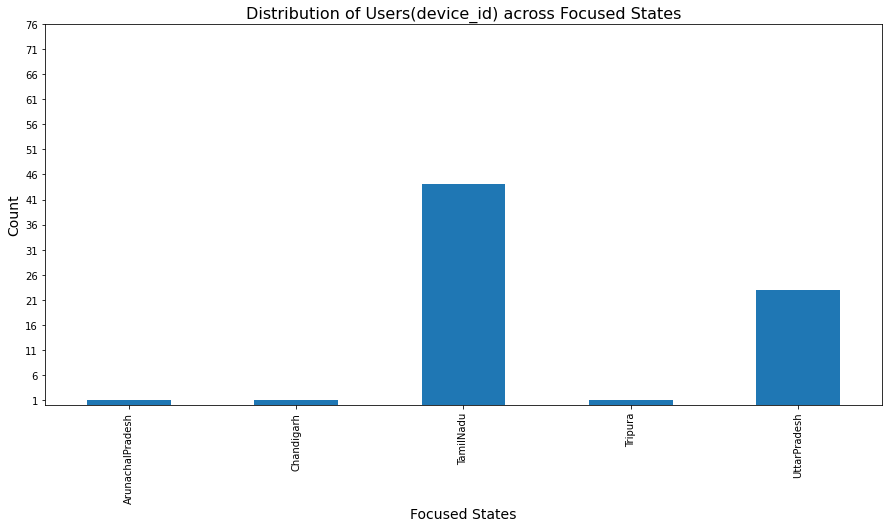

In [258]:
grouped_df=df_sql_csv_merge_uniquedeviceid.groupby("state")
figure = plt.figure(figsize=[15, 7])
grouped_df['device_id'].count().plot.bar()
plt.yticks(ticks=np.arange(1, 80, 5))
plt.xlabel(xlabel='Focused States', size=14)
plt.ylabel(ylabel='Count', size=14)
plt.title(label='Distribution of Users(device_id) across Focused States', size=16)

#1.2)Distribution of Users(device_id) across All States(Top 10)

In [259]:
grouped_df_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby("state")
grouped_df_allstates['device_id'].count().nlargest(10)

state
Maharashtra      53
WestBengal       45
TamilNadu        44
Karnataka        38
AndhraPradesh    35
Telangana        27
MadhyaPradesh    26
Rajasthan        23
UttarPradesh     23
Delhi            20
Name: device_id, dtype: int64

Text(0.5, 1.0, 'Distribution of Users(device_id) across All States(Top 10)')

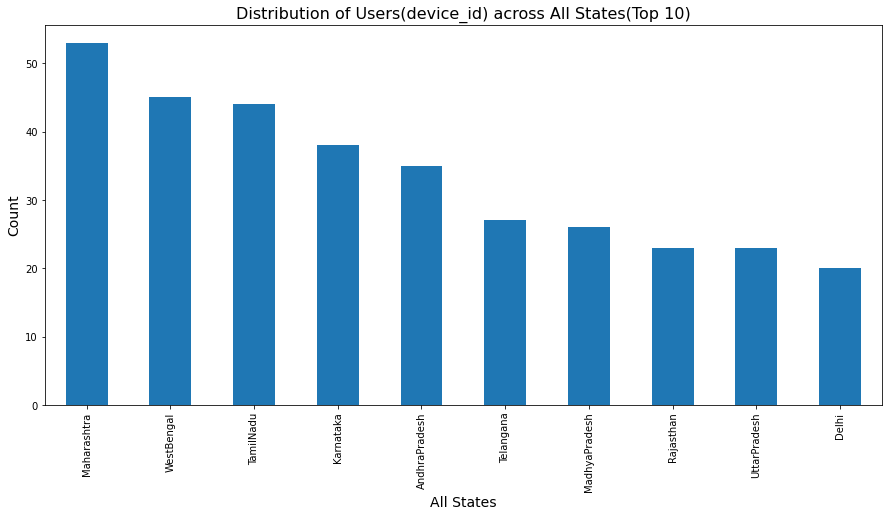

In [260]:
grouped_df_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby("state")
figure = plt.figure(figsize=[15, 7])
grouped_df_allstates['device_id'].count().nlargest(10).plot.bar()
plt.xlabel(xlabel='All States', size=14)
plt.ylabel(ylabel='Count', size=14)
plt.title(label='Distribution of Users(device_id) across All States(Top 10)', size=16)

#2)Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands)

#2.1)Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands) in Focused states

In [261]:
grouped_df_brand = df_sql_csv_merge_uniquedeviceid.groupby("phone_brand")
grouped_df_brand['device_id'].count().nlargest(n=10)

phone_brand
Samsung    22
Xiaomi     14
Huawei     13
OPPO        9
vivo        3
Coolpad     2
HTC         2
Meizu       2
Duowei      1
Flyer       1
Name: device_id, dtype: int64

Text(0.5, 1.0, 'Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands) in Focused states')

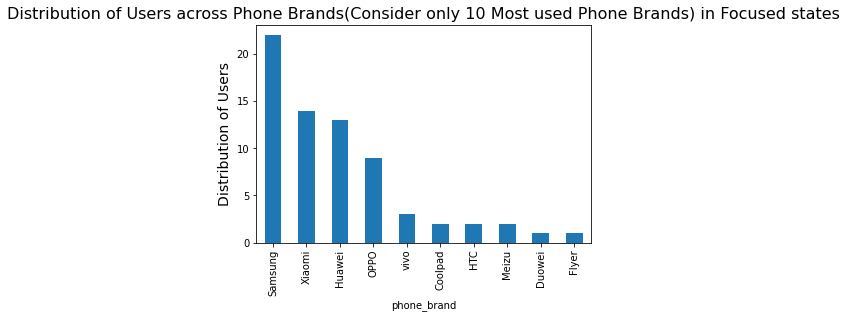

In [262]:
grouped_df_brand = df_sql_csv_merge_uniquedeviceid.groupby("phone_brand")
grouped_df_brand['device_id'].count().nlargest(n=10).plot.bar()
#plt.yticks(ticks=np.arange(30, 6000, 300))
plt.ylabel(ylabel='Distribution of Users', size=14)
plt.title(label='Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands) in Focused states', size=16)

# 2.2)Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands) in all states

In [263]:
grouped_df_brand_allstates = df_sql_csv_merge_allstates_uniquedeviceid.groupby("phone_brand")
grouped_df_brand_allstates['device_id'].count().nlargest(n=10)

phone_brand
Samsung    98
Xiaomi     91
Huawei     56
OPPO       39
vivo       35
Meizu      30
Coolpad    16
HTC         9
LeEco       7
Nubia       4
Name: device_id, dtype: int64

Text(0.5, 1.0, 'Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands) in All states')

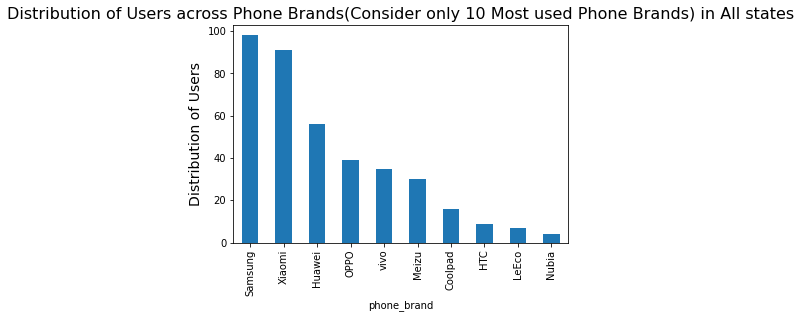

In [264]:
grouped_df_brand_allstates= df_sql_csv_merge_allstates_uniquedeviceid.groupby("phone_brand")
grouped_df_brand_allstates['device_id'].count().nlargest(n=10).plot.bar()
#plt.yticks(ticks=np.arange(30, 6000, 300))
plt.ylabel(ylabel='Distribution of Users', size=14)
plt.title(label='Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands) in All states', size=16)

#3)Distribution of Users across Gender.

#3.1)Distribution of Users across Gender(Focused States)

In [265]:
grouped_df_gender = df_sql_csv_merge_uniquedeviceid.groupby("gender")
grouped_df_gender['device_id'].count()

gender
F    27
M    43
Name: device_id, dtype: int64

Text(0.5, 1.0, 'Distribution of Users across Gender(Focused States)')

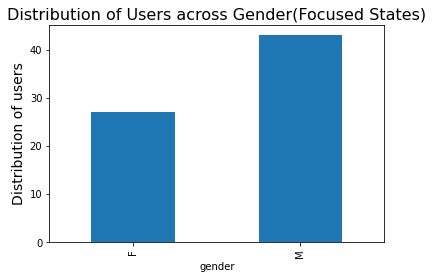

In [266]:
grouped_df_gender = df_sql_csv_merge_uniquedeviceid.groupby("gender")
grouped_df_gender['device_id'].count().plot.bar()
#plt.yticks(ticks=np.arange(30, 6000, 300))
plt.ylabel(ylabel='Distribution of users', size=14)
plt.title(label='Distribution of Users across Gender(Focused States)', size=16)

#3.2)Distribution of Users across Gender(All States)

In [267]:
grouped_df_gender_allstates = df_sql_csv_merge_allstates_uniquedeviceid.groupby("gender")
grouped_df_gender_allstates['device_id'].count()

gender
F    130
M    276
Name: device_id, dtype: int64

Text(0.5, 1.0, 'Distribution of Users across Gender(All States)')

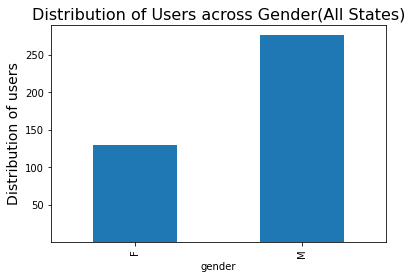

In [268]:
grouped_df_gender_allstates = df_sql_csv_merge_allstates_uniquedeviceid.groupby("gender")
grouped_df_gender_allstates['device_id'].count().plot.bar()
plt.yticks(ticks=np.arange(50,300,50))
plt.ylabel(ylabel='Distribution of users', size=14)
plt.title(label='Distribution of Users across Gender(All States)', size=16)

#4)Distribution of Users across Age Segments.

#4.1)Distribution of Users across Age Segments(Focused States)

In [269]:
user_agesegment = df_sql_csv_merge_uniquedeviceid.groupby("group")
user_agesegment['device_id'].count().sort_values(ascending=False)

group
M39+      10
M22-       9
M29-31     8
M23-26     7
M32-38     7
F23-       5
F24-26     5
F43+       5
F27-28     4
F29-32     4
F33-42     4
M27-28     2
Name: device_id, dtype: int64

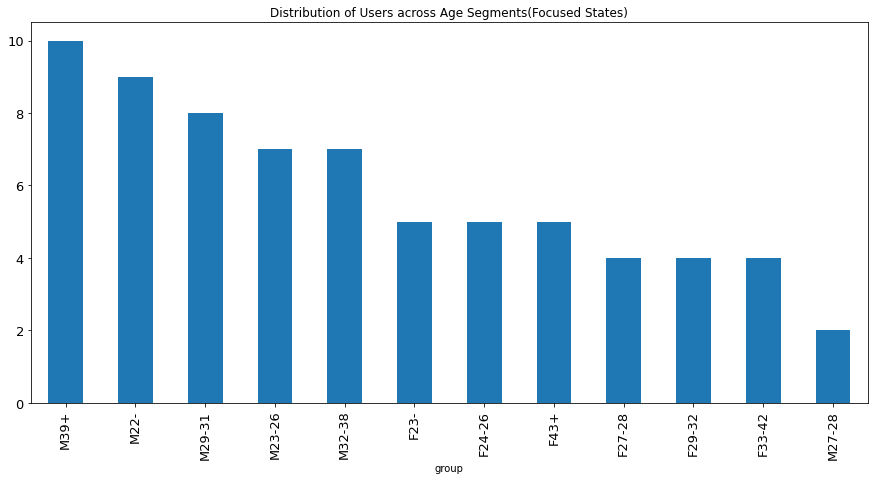

In [270]:
user_agesegment = df_sql_csv_merge_uniquedeviceid.groupby("group")
user_agesegment['device_id'].count().sort_values(ascending=False).plot.bar(fontsize = 13,figsize = (15,7),title = "Distribution of Users across Age Segments(Focused States)")

#4.2)Distribution of Users across Age Segments(All States)

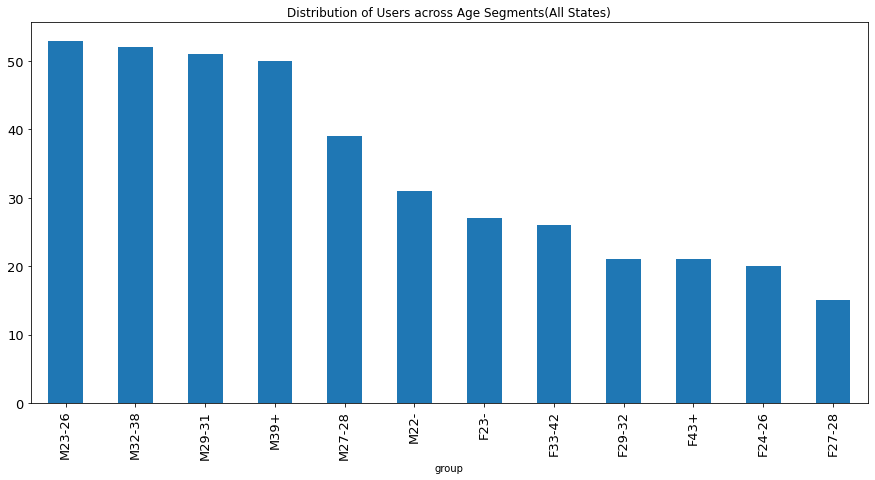

In [271]:
user_agesegment_allstates = df_sql_csv_merge_allstates_uniquedeviceid.groupby("group")
user_agesegment_allstates['device_id'].count().sort_values(ascending=False).plot.bar(fontsize = 13,figsize = (15,7),title = "Distribution of Users across Age Segments(All States)")

#5)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each Age Segment, State, Gender.

#5.1)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each Age Segment(Focused States)

In [272]:
phone_ageseg= df_sql_csv_merge_uniquedeviceid.groupby(["phone_brand","group"])["group"].count()
phone_ageseg

phone_brand  group 
Coolpad      M39+      2
Duowei       F33-42    1
Flyer        M29-31    1
HTC          M22-      1
             M27-28    1
Huawei       F23-      1
             F24-26    1
             F33-42    2
             F43+      1
             M22-      1
             M23-26    2
             M29-31    1
             M32-38    2
             M39+      2
LG           M29-31    1
Meizu        M22-      1
             M29-31    1
OPPO         F29-32    1
             M22-      2
             M23-26    2
             M27-28    1
             M32-38    1
             M39+      2
Samsung      F23-      2
             F24-26    3
             F27-28    4
             F29-32    1
             F43+      3
             M22-      2
             M23-26    1
             M29-31    3
             M32-38    1
             M39+      2
Xiaomi       F23-      2
             F29-32    2
             F33-42    1
             M22-      2
             M23-26    2
             M29-31    1
     

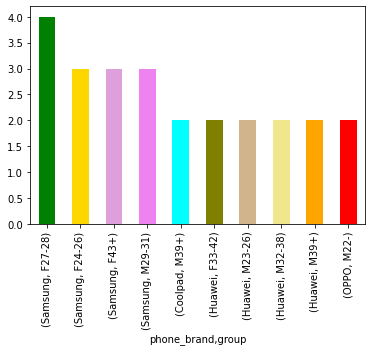

In [273]:
phone_ageseg= df_sql_csv_merge_uniquedeviceid.groupby(["phone_brand","group"])["group"].count().nlargest(n=10).plot(kind='bar',stacked=True, color=["green","gold","plum","violet","cyan","olive","tan","khaki","orange","red","pink","lime"])

#5.2)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each Age Segment(All States)

In [274]:
phone_ageseg_allstates= df_sql_csv_merge_allstates_uniquedeviceid.groupby(["phone_brand","group"])["group"].count()
phone_ageseg_allstates

phone_brand   group 
 Coolby       F23-       1
              M27-28     2
Amagatarai    M23-26     1
China Mobile  M29-31     1
              M32-38     1
Coolpad       F24-26     1
              F29-32     2
              F43+       1
              M22-       1
              M23-26     3
              M27-28     2
              M29-31     1
              M39+       5
Cubei Cube    F27-28     1
Duowei        F33-42     1
Flyer         M29-31     1
HTC           F29-32     1
              M22-       2
              M23-26     1
              M27-28     2
              M29-31     1
              M39+       2
Hammer        M27-28     1
Huawei        F23-       3
              F24-26     3
              F27-28     2
              F29-32     1
              F33-42     5
              F43+       4
              M22-       5
              M23-26     8
              M27-28     5
              M29-31     7
              M32-38     5
              M39+       8
LG            M29-31     1
LeEco  

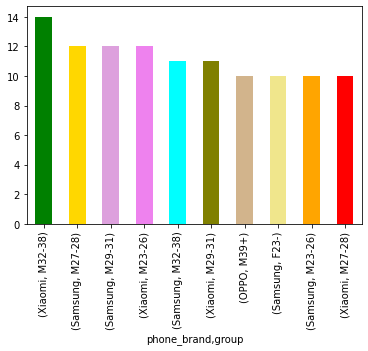

In [275]:
phone_ageseg_allstates= df_sql_csv_merge_allstates_uniquedeviceid.groupby(["phone_brand","group"])["group"].count().nlargest(n=10).plot(kind='bar',stacked=True, color=["green","gold","plum","violet","cyan","olive","tan","khaki","orange","red","pink","lime"])

#5.3)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) across gender(Focused States)

In [276]:
phone_gender= df_sql_csv_merge_uniquedeviceid.groupby(["phone_brand","gender"])["gender"].count()
phone_gender

phone_brand  gender
Coolpad      M          2
Duowei       F          1
Flyer        M          1
HTC          M          2
Huawei       F          5
             M          8
LG           M          1
Meizu        M          2
OPPO         F          1
             M          8
Samsung      F         13
             M          9
Xiaomi       F          5
             M          9
vivo         F          2
             M          1
Name: gender, dtype: int64

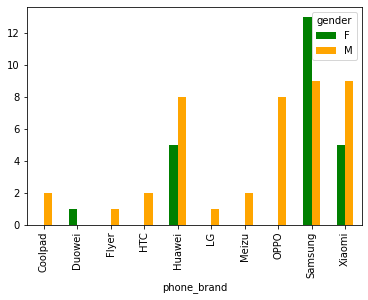

In [277]:
phone_gender= df_sql_csv_merge_uniquedeviceid.groupby(["phone_brand","gender"])["gender"].count().nlargest(n=14).unstack(level=-1).head(10).plot(kind='bar',stacked=False, color=["green", "orange"])

#5.4)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) across gender(All States)

In [278]:
phone_gender_allstates= df_sql_csv_merge_allstates_uniquedeviceid.groupby(["phone_brand","gender"])["gender"].count()
phone_gender_allstates

phone_brand   gender
 Coolby       F          1
              M          2
Amagatarai    M          1
China Mobile  M          2
Coolpad       F          4
              M         12
Cubei Cube    F          1
Duowei        F          1
Flyer         M          1
HTC           F          1
              M          8
Hammer        M          1
Huawei        F         18
              M         38
LG            M          1
LeEco         F          1
              M          6
Lenovo        F          1
              M          2
Meitu         F          1
Meizu         F          7
              M         23
Mi Ge         F          1
Nubia         F          1
              M          3
OPPO          F          8
              M         31
One Plus      M          1
Projet News   M          1
Punale        M          1
Samsung       F         42
              M         56
Xiaomi        F         30
              M         61
Yi Tong       M          1
Youmi         M          1
vivo   

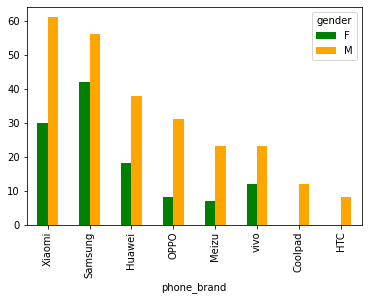

In [279]:
phone_gender_allstates= df_sql_csv_merge_allstates_uniquedeviceid.groupby(["phone_brand","gender"])["gender"].count().nlargest(n=14).unstack(level=-1).head(10).plot(kind='bar',stacked=False, color=["green", "orange"])

#5.5)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each State(Focused states)

In [280]:
phone_fsc_state = df_sql_csv_merge_uniquedeviceid.groupby(["phone_brand","state"])
phone_fsc_state['state'].count()

phone_brand  state           
Coolpad      TamilNadu            1
             UttarPradesh         1
Duowei       TamilNadu            1
Flyer        UttarPradesh         1
HTC          UttarPradesh         2
Huawei       TamilNadu            9
             UttarPradesh         4
LG           UttarPradesh         1
Meizu        TamilNadu            1
             UttarPradesh         1
OPPO         TamilNadu            6
             UttarPradesh         3
Samsung      ArunachalPradesh     1
             TamilNadu           15
             UttarPradesh         6
Xiaomi       Chandigarh           1
             TamilNadu            9
             Tripura              1
             UttarPradesh         3
vivo         TamilNadu            2
             UttarPradesh         1
Name: state, dtype: int64

Text(0.5, 1.0, 'Distribution of Phone Brands across the Focused States')

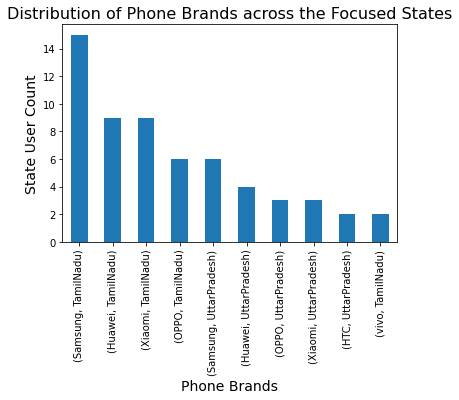

In [281]:
phone_fsc_state = df_sql_csv_merge_uniquedeviceid.groupby(["phone_brand","state"])
phone_fsc_state['state'].count().nlargest(n=10).plot.bar()
#plt.yticks(ticks=np.arange(30, 6000, 300))
plt.xlabel(xlabel='Phone Brands', size=14)
plt.ylabel(ylabel='State User Count', size=14)
plt.title(label='Distribution of Phone Brands across the Focused States', size=16)

#5.6)Distribution of Phone Brands(Consider only 10 Most used Phone Brands) for each State(All states)

In [282]:
phone_state_allstates = df_sql_csv_merge_allstates_uniquedeviceid.groupby(["phone_brand","state"])
phone_state_allstates['state'].count()

phone_brand   state           
 Coolby       AndhraPradesh        1
              Haryana              1
              Telangana            1
Amagatarai    Maharashtra          1
China Mobile  Delhi                1
              Telangana            1
Coolpad       AndhraPradesh        2
              Delhi                1
              Gujarat              1
              Karnataka            2
              MadhyaPradesh        1
              Maharashtra          1
              Rajasthan            1
              TamilNadu            1
              Telangana            1
              UttarPradesh         1
              WestBengal           4
Cubei Cube    Bihar                1
Duowei        TamilNadu            1
Flyer         UttarPradesh         1
HTC           Chhattisgarh         1
              Delhi                1
              Haryana              1
              Karnataka            1
              Maharashtra          1
              Rajasthan            1
       

Text(0.5, 1.0, 'Distribution of Phone Brands across the States')

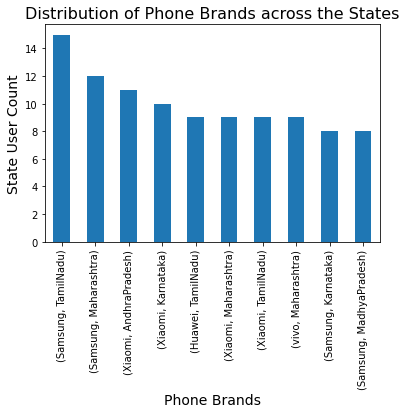

In [283]:
phone_state_allstates = df_sql_csv_merge_allstates_uniquedeviceid.groupby(["phone_brand","state"])
phone_state_allstates['state'].count().nlargest(n=10).plot.bar()
#plt.yticks(ticks=np.arange(30, 6000, 300))
plt.xlabel(xlabel='Phone Brands', size=14)
plt.ylabel(ylabel='State User Count', size=14)
plt.title(label='Distribution of Phone Brands across the States', size=16)

#6)Distribution of Gender for each State, Age Segment and Phone Brand(Consider only 10 Most used Phone Brands)

#6.1)Distribution of Gender for each State(Focused)

In [284]:
gendercountfocused=df_sql_csv_merge_uniquedeviceid.groupby(["state","gender",])
gendercountfocused["device_id"].count()

state             gender
ArunachalPradesh  M          1
Chandigarh        M          1
TamilNadu         F         18
                  M         26
Tripura           M          1
UttarPradesh      F          9
                  M         14
Name: device_id, dtype: int64

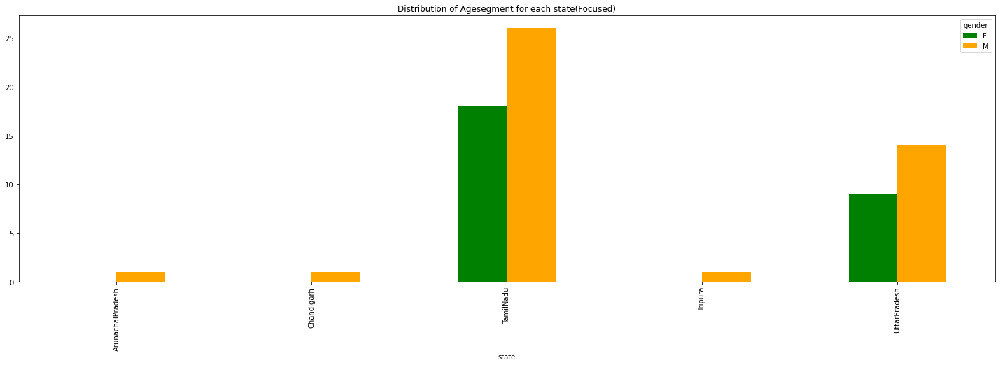

In [285]:
gendercountfocused=df_sql_csv_merge_uniquedeviceid.groupby(["state","gender"])["device_id"].count().unstack(level=-1).plot(kind='bar',figsize = (25,7),title = "Distribution of Agesegment for each state(Focused)",stacked=False, color=["green", "orange","red","yellow"])

#6.2)Distribution of Gender for each state(All States)

In [286]:
gendercountallstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["state","gender"])
gendercountallstates["device_id"].count()

state             gender
AndhraPradesh     F         12
                  M         23
ArunachalPradesh  M          1
Assam             M          2
Bihar             F          7
                  M          7
Chandigarh        M          1
Chhattisgarh      F          1
                  M          3
Delhi             F          4
                  M         16
Goa               M          1
Gujarat           F          1
                  M         12
Haryana           F          3
                  M          6
JammuandKashmir   M          3
Jharkhand         F          2
                  M          3
Karnataka         F         12
                  M         26
Kerala            F          3
                  M          1
MadhyaPradesh     F          8
                  M         18
Maharashtra       F         16
                  M         37
Nagaland          F          1
                  M          2
Orissa            M          4
Pondicherry       F          1
Punjab        

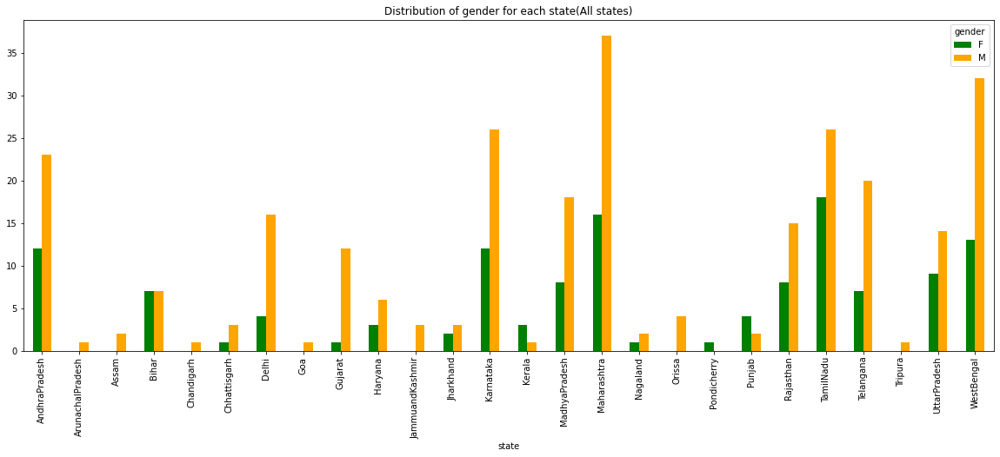

In [287]:
gendercountallstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["state","gender",])
gendercountallstates["device_id"].count().unstack(level=-1).plot(kind='bar',figsize = (20,7),title = "Distribution of gender for each state(All states)",stacked=False, color=["green", "orange"])

#6.3)Distribution of Gender for Age Segment(Focused States)

In [288]:
genderagecount=df_sql_csv_merge_uniquedeviceid.groupby(["group","gender"])
genderagecount["device_id"].count()

group   gender
F23-    F          5
F24-26  F          5
F27-28  F          4
F29-32  F          4
F33-42  F          4
F43+    F          5
M22-    M          9
M23-26  M          7
M27-28  M          2
M29-31  M          8
M32-38  M          7
M39+    M         10
Name: device_id, dtype: int64

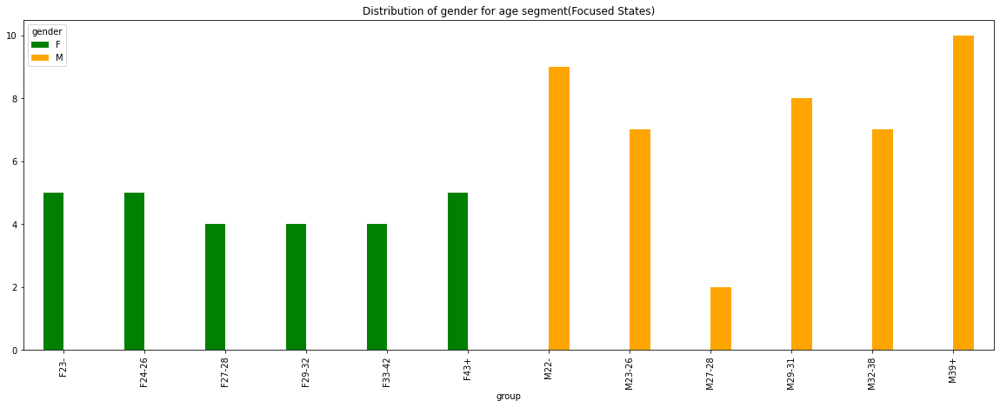

In [289]:
genderagecount=df_sql_csv_merge_uniquedeviceid.groupby(["group","gender"])
genderagecount["device_id"].count().unstack(level=-1).plot(kind='bar',figsize = (20,7),title = "Distribution of gender for age segment(Focused States)",stacked=False, color=["green", "orange","yellow","blue","pink","cyan"])

#6.4)Distribution of Gender for agesgegment (All states)

In [290]:
genderagecountallstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["group","gender"])
genderagecountallstates["device_id"].count()

group   gender
F23-    F         27
F24-26  F         20
F27-28  F         15
F29-32  F         21
F33-42  F         26
F43+    F         21
M22-    M         31
M23-26  M         53
M27-28  M         39
M29-31  M         51
M32-38  M         52
M39+    M         50
Name: device_id, dtype: int64

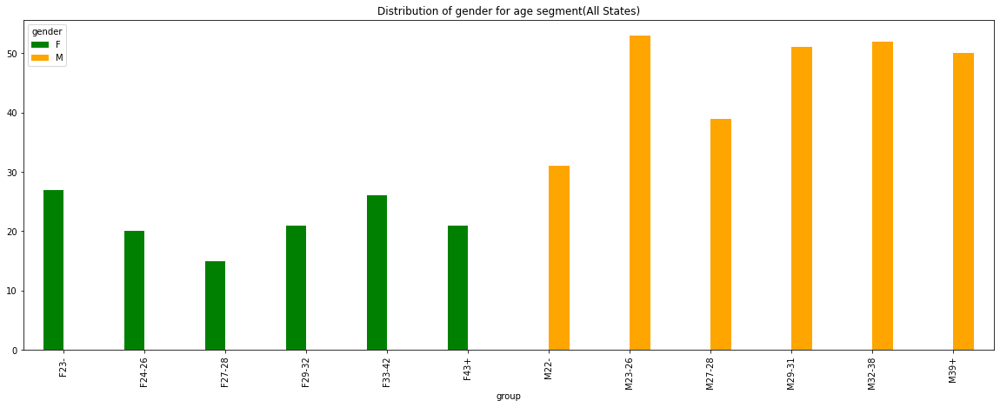

In [291]:
genderagecountallstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["group","gender"])
genderagecountallstates["device_id"].count().unstack(level=-1).plot(kind='bar',figsize = (20,7),title = "Distribution of gender for age segment(All States)",stacked=False, color=["green", "orange","yellow","blue","pink","cyan"])

#6.5)Distribution of Gender for Phone Brand(Consider only 10 Most used Phone Brands)(Focused States)

In [292]:
genderphonebrandcount=df_sql_csv_merge_uniquedeviceid.groupby(["gender","phone_brand"], observed=True)['phone_brand'].value_counts(ascending=False)
genderphonebrandcount.groupby(level='gender').nlargest(10).reset_index(level=0, drop=True)

gender  phone_brand  phone_brand
F       Samsung      Samsung        13
        Huawei       Huawei          5
        Xiaomi       Xiaomi          5
        vivo         vivo            2
        Duowei       Duowei          1
        OPPO         OPPO            1
M       Samsung      Samsung         9
        Xiaomi       Xiaomi          9
        Huawei       Huawei          8
        OPPO         OPPO            8
        Coolpad      Coolpad         2
        HTC          HTC             2
        Meizu        Meizu           2
        Flyer        Flyer           1
        LG           LG              1
        vivo         vivo            1
Name: phone_brand, dtype: int64

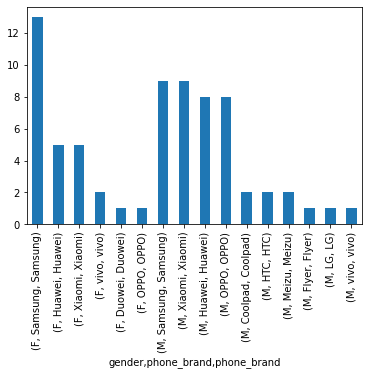

In [293]:
from matplotlib.cbook import Stack
genderphonebrandcount=df_sql_csv_merge_uniquedeviceid.groupby(["gender","phone_brand"], observed=True)['phone_brand'].value_counts(ascending=False)
genderphonebrandcount.groupby(level='gender').nlargest(10).reset_index(level=0, drop=True).plot(kind='bar')

#6.6)Distribution of Gender for Phone Brand(Consider only 10 Most used Phone Brands)(All States)

In [294]:
genderphonebrandcountallstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby("gender", observed=True)['phone_brand'].value_counts(ascending=False)
genderphonebrandcountallstates.groupby(level='gender').nlargest(10).reset_index(level=0, drop=True)

gender  phone_brand
F       Samsung        42
        Xiaomi         30
        Huawei         18
        vivo           12
        OPPO            8
        Meizu           7
        Coolpad         4
         Coolby         1
        Cubei Cube      1
        Duowei          1
M       Xiaomi         61
        Samsung        56
        Huawei         38
        OPPO           31
        Meizu          23
        vivo           23
        Coolpad        12
        HTC             8
        LeEco           6
        Nubia           3
Name: phone_brand, dtype: int64

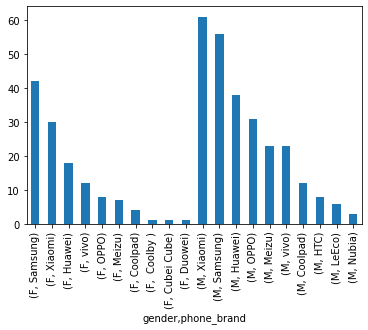

In [295]:
from matplotlib.cbook import Stack
genderphonebrandcountallstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby("gender", observed=True)['phone_brand'].value_counts(ascending=False)
genderphonebrandcountallstates.groupby(level='gender').nlargest(10).reset_index(level=0, drop=True).plot(kind='bar')

#7)Distribution of Age Segments for each State, Gender and Phone Brand(Consider only 10 Most used Phone Brands).

#7.1)Distribution of Age Segments for each State(Focused states)

In [296]:
agesegmentandstate=df_sql_csv_merge_uniquedeviceid.groupby(["state","group"])["group"].count()
agesegmentandstate

state             group 
ArunachalPradesh  M29-31    1
Chandigarh        M39+      1
TamilNadu         F23-      2
                  F24-26    4
                  F27-28    2
                  F29-32    4
                  F33-42    3
                  F43+      3
                  M22-      6
                  M23-26    5
                  M27-28    1
                  M29-31    2
                  M32-38    5
                  M39+      7
Tripura           M22-      1
UttarPradesh      F23-      3
                  F24-26    1
                  F27-28    2
                  F33-42    1
                  F43+      2
                  M22-      2
                  M23-26    2
                  M27-28    1
                  M29-31    5
                  M32-38    2
                  M39+      2
Name: group, dtype: int64

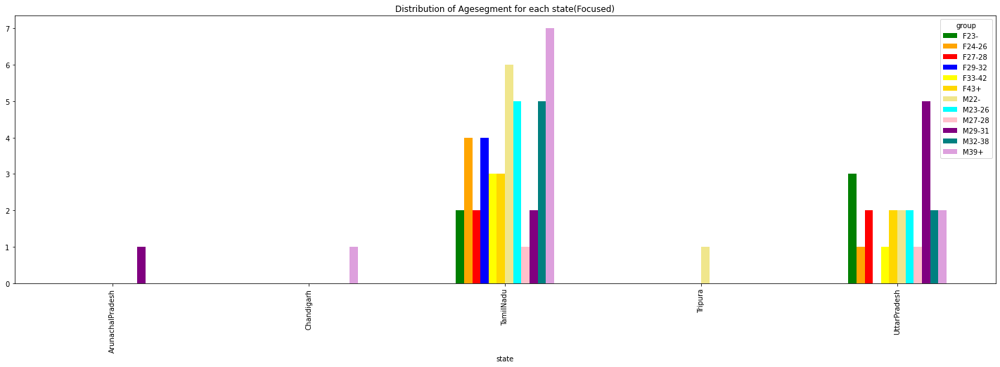

In [297]:
agesegmentandstate=df_sql_csv_merge_uniquedeviceid.groupby(["state","group"])["group"].count().unstack(level=-1).plot(kind='bar',figsize = (25,7),title = "Distribution of Agesegment for each state(Focused)",stacked=False, color=["green", "orange","red","blue","yellow","gold","khaki","cyan","pink","purple","teal","plum"])

#7.2)Distribution of Age Segments for each State(Allstates)

In [298]:
agesegmentandstate_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["state","group"])["group"].count()
agesegmentandstate_allstates

state             group 
AndhraPradesh     F23-       3
                  F24-26     2
                  F29-32     1
                  F33-42     5
                  F43+       1
                  M22-       1
                  M23-26     2
                  M27-28     6
                  M29-31     4
                  M32-38     6
                  M39+       4
ArunachalPradesh  M29-31     1
Assam             M22-       1
                  M32-38     1
Bihar             F23-       3
                  F27-28     1
                  F29-32     1
                  F33-42     2
                  M22-       1
                  M23-26     1
                  M32-38     1
                  M39+       4
Chandigarh        M39+       1
Chhattisgarh      F29-32     1
                  M22-       1
                  M32-38     1
                  M39+       1
Delhi             F24-26     2
                  F33-42     1
                  F43+       1
                  M23-26     1
              

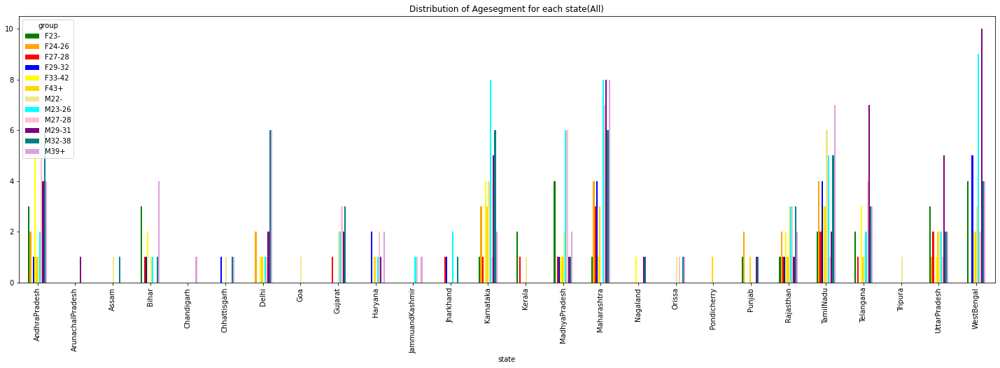

In [299]:
agesegmentandstate_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["state","group"])["group"].count().unstack(level=-1).plot(kind='bar',figsize = (25,7),title = "Distribution of Agesegment for each state(All)",stacked=False, color=["green", "orange","red","blue","yellow","gold","khaki","cyan","pink","purple","teal","plum"])

#7.3)Distribution of Age Segments across Gender(Focused states)

In [300]:
ageandgender=df_sql_csv_merge_uniquedeviceid.groupby(["gender","group"])["gender"].count()
ageandgender

gender  group 
F       F23-       5
        F24-26     5
        F27-28     4
        F29-32     4
        F33-42     4
        F43+       5
M       M22-       9
        M23-26     7
        M27-28     2
        M29-31     8
        M32-38     7
        M39+      10
Name: gender, dtype: int64

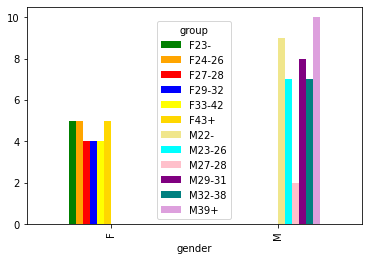

In [311]:
ageandgender=df_sql_csv_merge_uniquedeviceid.groupby(["gender","group"])["gender"].count().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange","red","blue","yellow","gold","khaki","cyan","pink","purple","teal","plum"])

#7.4)Distribution of Age Segments for Gender(All states)

In [302]:
ageandgender_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["gender","group"])["gender"].count()
ageandgender_allstates

gender  group 
F       F23-      27
        F24-26    20
        F27-28    15
        F29-32    21
        F33-42    26
        F43+      21
M       M22-      31
        M23-26    53
        M27-28    39
        M29-31    51
        M32-38    52
        M39+      50
Name: gender, dtype: int64

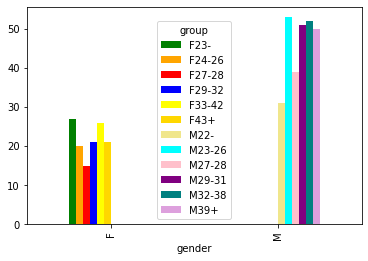

In [312]:
ageandgender_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(["gender","group"])["gender"].count().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange","red","blue","yellow","gold","khaki","cyan","pink","purple","teal","plum"])

#7.5)Distribution of Agesegment for phone brand(TOP 10)(focused states)

In [304]:
df_sorted_focused=df_sql_csv_merge_uniquedeviceid.groupby(["group","phone_brand"])["phone_brand"].value_counts(ascending=False)
df_sorted_focused.groupby(level='group').nlargest(10).reset_index(level=0, drop=True)

group   phone_brand  phone_brand
F23-    Samsung      Samsung        2
        Xiaomi       Xiaomi         2
        Huawei       Huawei         1
F24-26  Samsung      Samsung        3
        Huawei       Huawei         1
        vivo         vivo           1
F27-28  Samsung      Samsung        4
F29-32  Xiaomi       Xiaomi         2
        OPPO         OPPO           1
        Samsung      Samsung        1
F33-42  Huawei       Huawei         2
        Duowei       Duowei         1
        Xiaomi       Xiaomi         1
F43+    Samsung      Samsung        3
        Huawei       Huawei         1
        vivo         vivo           1
M22-    OPPO         OPPO           2
        Samsung      Samsung        2
        Xiaomi       Xiaomi         2
        HTC          HTC            1
        Huawei       Huawei         1
        Meizu        Meizu          1
M23-26  Huawei       Huawei         2
        OPPO         OPPO           2
        Xiaomi       Xiaomi         2
        Samsung  

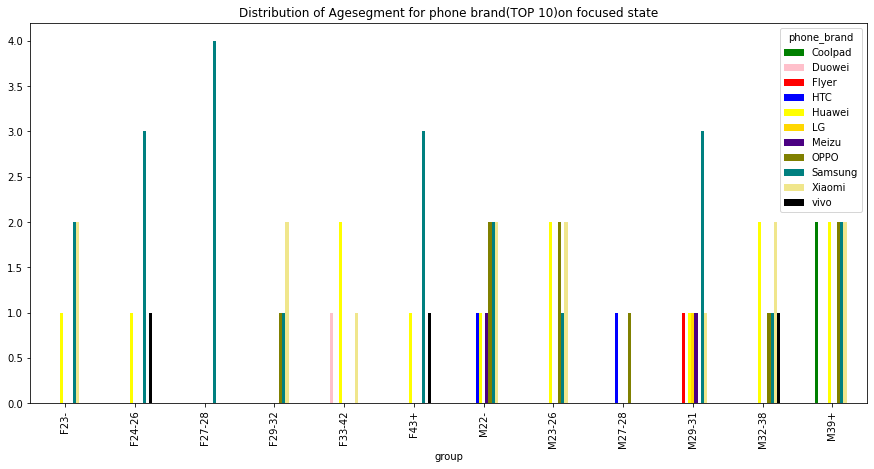

In [305]:
df_sql_csv_merge_uniquedeviceid.groupby(["group","phone_brand"])["phone_brand"].count().unstack(level=-1).plot(figsize = (15,7),kind='bar',title = "Distribution of Agesegment for phone brand(TOP 10)on focused state",stacked=False, color=["green", "pink","red","blue","yellow","gold","indigo","olive","teal","khaki","Black"])

#7.6)Distribution of Agesegment for phone brand(TOP 10)on all states

In [306]:
df_sorted_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(by=["group"], observed=True)['phone_brand'].value_counts(ascending=False)
df_sorted_allstates.groupby(level='group').nlargest(10).reset_index(level=0, drop=True)

group   phone_brand 
F23-    Samsung         10
        Xiaomi           6
        Huawei           3
        Meizu            3
        OPPO             3
         Coolby          1
        vivo             1
F24-26  Samsung          6
        Xiaomi           6
        Huawei           3
        vivo             2
        Coolpad          1
        Meizu            1
        OPPO             1
F27-28  Samsung          6
        vivo             3
        Huawei           2
        Cubei Cube       1
        Meitu            1
        Meizu            1
        Xiaomi           1
F29-32  Samsung          7
        Xiaomi           5
        Coolpad          2
        OPPO             2
        vivo             2
        HTC              1
        Huawei           1
        Meizu            1
F33-42  Xiaomi           8
        Huawei           5
        Samsung          5
        OPPO             2
        vivo             2
        Duowei           1
        LeEco            1
       

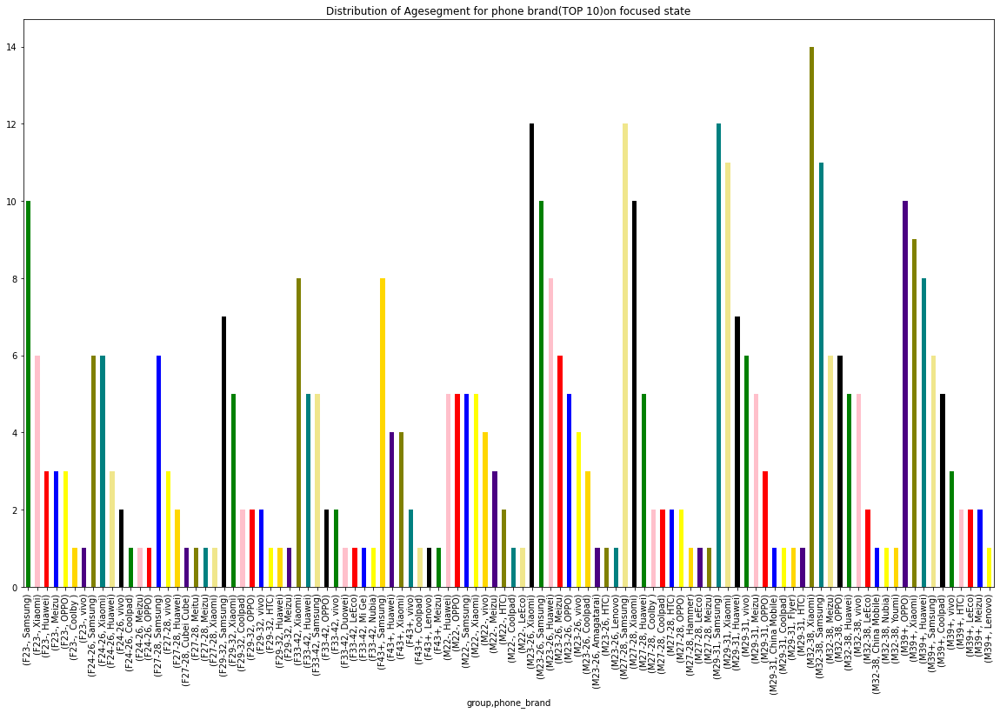

In [307]:
df_sorted_allstates=df_sql_csv_merge_allstates_uniquedeviceid.groupby(by=["group"], observed=True)['phone_brand'].value_counts(ascending=False)
df_sorted_allstates.groupby(level='group').nlargest(10).reset_index(level=0, drop=True).plot(figsize = (20,12),kind='bar',title = "Distribution of Agesegment for phone brand(TOP 10)on focused state",stacked=False, color=["green", "pink","red","blue","yellow","gold","indigo","olive","teal","khaki","Black"])

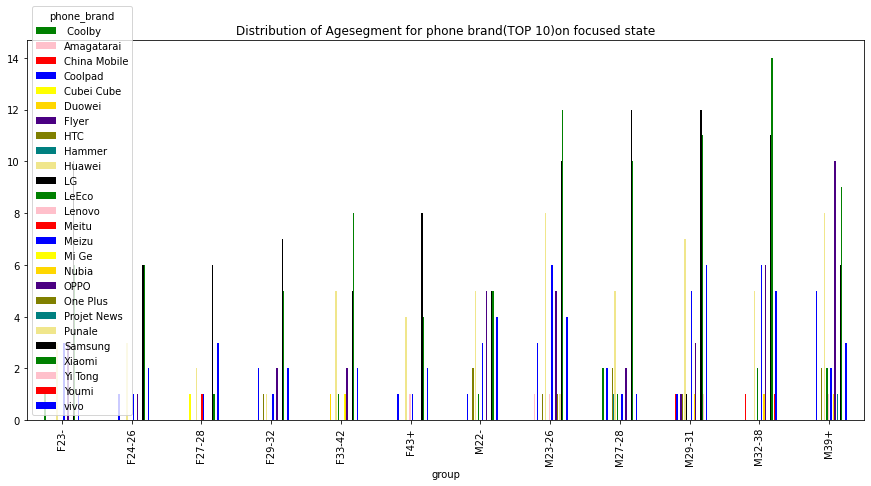

In [308]:
df_sql_csv_merge_allstates_uniquedeviceid.groupby(["group","phone_brand"])["phone_brand"].count().unstack(level=-1).plot(figsize = (15,7),kind='bar',title = "Distribution of Agesegment for phone brand(TOP 10)on focused state",stacked=False, color=["green", "pink","red","blue","yellow","gold","indigo","olive","teal","khaki","Black"])

#8)Hourly distribution of Phone Calls across States

#8.1)Hourly distribution of Phone Calls across States(Focused States)

Text(0.5, 1.0, 'Hourly distribution of Phone Calls(Focused states)')

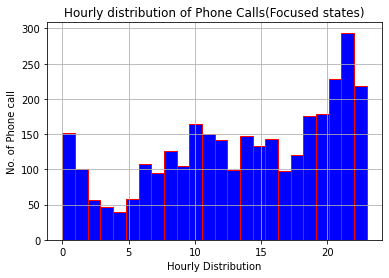

In [309]:
df_sql_csv_merge['time_hour'].hist(color='blue',bins=24,edgecolor='red')
#x and y-axis labels 
plt.xlabel('Hourly Distribution') 
plt.ylabel('No. of Phone call')
#plot title 
plt.title('Hourly distribution of Phone Calls(Focused states)') 

Text(0.5, 1.0, 'Hourly distribution of Phone Calls(Focused states)')

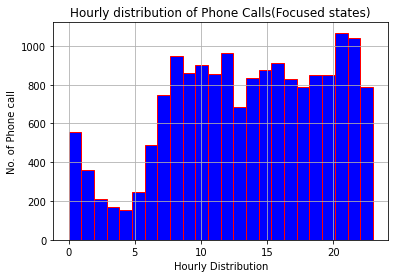

In [310]:
df_sql_csv_merge_allstates['time_hour'].hist(color='blue',bins=24,edgecolor='red')
#x and y-axis labels 
plt.xlabel('Hourly Distribution') 
plt.ylabel('No. of Phone call')
#plot title 
plt.title('Hourly distribution of Phone Calls(Focused states)')

**Conclusion** :

a.	**TAMIL NADU** has the most users in both **MALE and FEMALE**. We recommend 
clients to focus more on TAMIL NADU in our state group.

b.	**SAMSUNG** is the most used brand in focused States. Clients can make combo offers of their call plan with new users who purchase SAMSUNG brand mobile.

c.	Most people are active between **11 -12 pm** in most of the States. Clients can run the promotions activity in this hour.

d.	**M39+** is the Age segment with maximum users. Clients can propose unique propositions for the segment. We can promote OTT content like Netflix, Hotstar, Amazon Prime etc. to generate additional revenue.
